In [35]:
%matplotlib inline
%env CUDA_VISIBLE_DEVICES = 1

env: CUDA_VISIBLE_DEVICES=1


In [58]:
%run mylibrary.ipynb
%run mymodel.ipynb

In [37]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import os
import tensorflow as tf
import math
import random
from ast import literal_eval

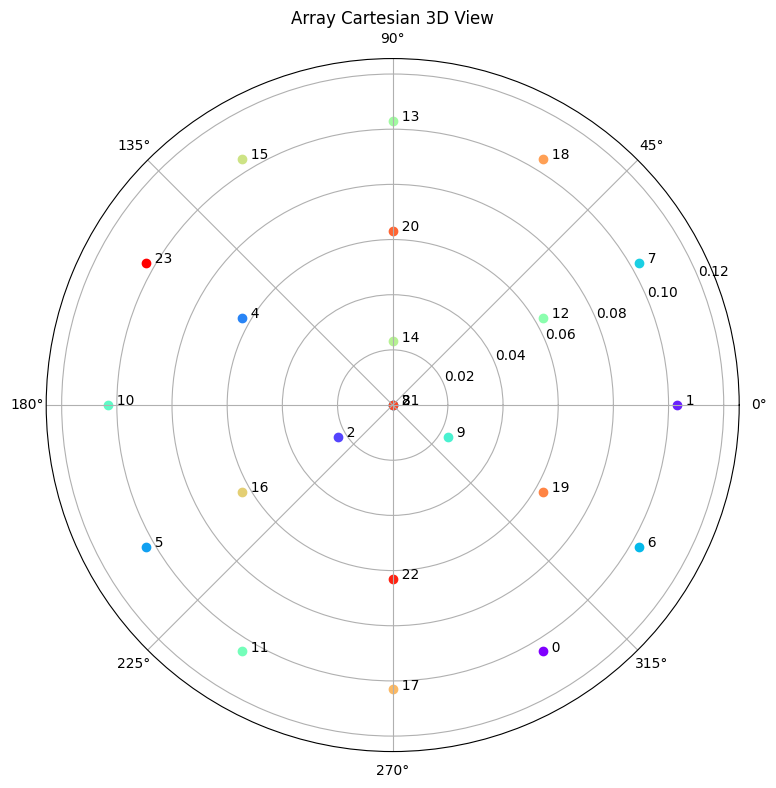

In [16]:
geometry = pd.read_csv('../tools/AA_geometry.tsv', header=None, sep='\t')
AA_Geometry = geometry.to_numpy()
visualizer = Visualizer(AA_Geometry)
visualizer.polar(fig_size=(10,9))#,save_dir = '../plot/')

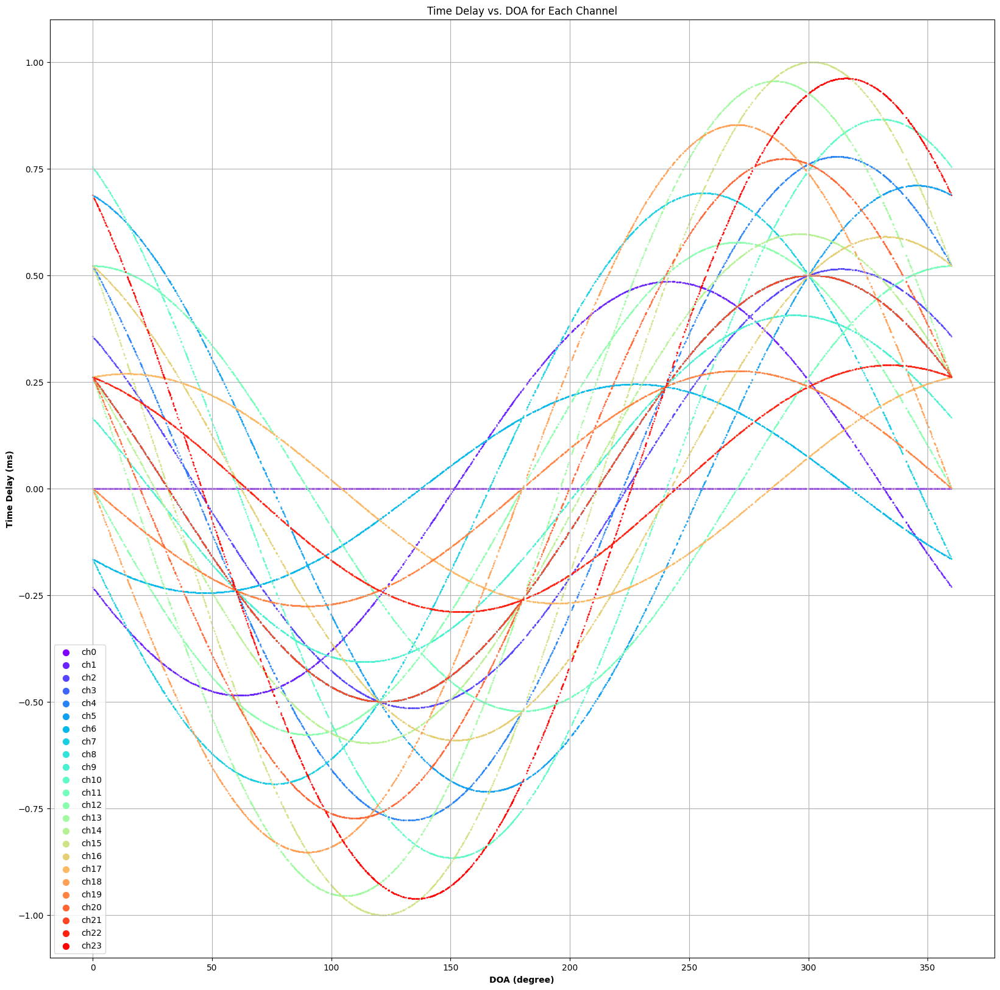

In [45]:
# Extract data from files
data = DataExtract("../data/rss360/", 24)
inputs, speed, labels = data.get_data()
data.plot()

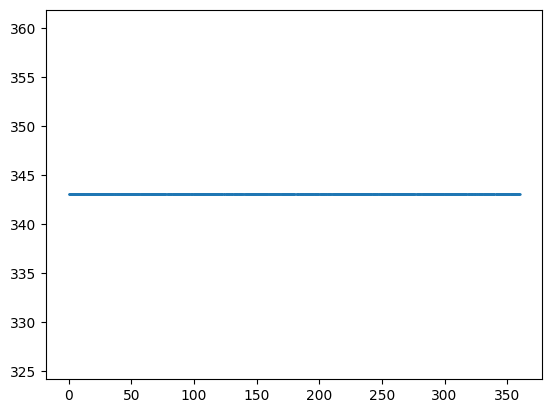

In [46]:
plt.scatter(labels, speed, s=0.5)

In [19]:
df_with_he = pd.read_csv("../plot/models_evaluation_with_weights_initialization.csv")
list_channels = [re.findall(r'\d+',item['Channels']) for i,item in df_with_he.iterrows()]
list_channels = [sorted([int(i) for i in ls]) for ls in list_channels]
list_channels

[[1, 14, 21],
 [12, 14, 20],
 [10, 11, 13],
 [8, 17, 22],
 [6, 11, 20],
 [7, 8, 21],
 [0, 12, 22],
 [8, 11, 13],
 [2, 10, 22],
 [7, 15, 22],
 [8, 16, 23],
 [1, 4, 14],
 [1, 5, 12],
 [7, 8, 11],
 [3, 11, 17],
 [6, 12, 13],
 [3, 7, 10],
 [4, 13, 23],
 [10, 13, 22],
 [4, 9, 15],
 [4, 16, 17],
 [3, 10, 13],
 [3, 10, 13],
 [8, 10, 15],
 [6, 16, 22],
 [15, 19, 21],
 [1, 13, 19],
 [5, 18, 21],
 [3, 4, 21],
 [7, 9, 11],
 [8, 15, 17],
 [0, 7, 18],
 [1, 14, 21],
 [17, 20, 22],
 [5, 13, 14],
 [4, 14, 22],
 [0, 15, 23],
 [5, 15, 23],
 [3, 7, 10],
 [0, 2, 12],
 [2, 10, 19],
 [3, 9, 20],
 [6, 15, 21],
 [3, 12, 20],
 [10, 12, 13],
 [0, 7, 17],
 [10, 11, 18],
 [13, 14, 16],
 [5, 12, 22],
 [15, 19, 23],
 [0, 2, 4, 6, 14, 23],
 [2, 4, 5, 6, 10, 16],
 [1, 5, 6, 15, 16, 22],
 [2, 5, 9, 13, 17, 22],
 [2, 10, 12, 14, 20, 23],
 [5, 6, 7, 13, 19, 23],
 [5, 11, 13, 15, 21, 22],
 [3, 8, 14, 15, 16, 17],
 [10, 14, 16, 17, 20, 21],
 [0, 1, 2, 13, 14, 15],
 [0, 2, 5, 7, 9, 18],
 [2, 3, 9, 10, 11, 15],
 [4, 8, 9, 1

In [20]:
# Get the list of channels with loss less than 55 
# The 75 is a convience number from the results
top_with_he =  df_with_he.index[df_with_he['Loss'] < 55].tolist()
top_list_channels = [list_channels[i] for i in top_with_he]
top_list_channels.append(list(range(0,24)))
print(len(top_list_channels))
top_list_channels

15


[[6, 12, 13],
 [1, 13, 19],
 [0, 7, 18],
 [3, 12, 20],
 [12, 13, 15, 17, 19, 22],
 [2, 9, 10, 12, 17, 18],
 [2, 7, 9, 13, 19, 20],
 [8, 12, 16, 18, 21, 22],
 [2, 6, 8, 9, 12, 15, 18, 20, 22],
 [0, 2, 4, 8, 9, 12, 18, 19, 22],
 [1, 2, 3, 4, 9, 13, 17, 18, 22],
 [0, 3, 5, 6, 9, 12, 14, 15, 18, 19, 20, 23],
 [2, 3, 4, 6, 8, 10, 12, 13, 14, 15, 17, 18, 19, 22, 23],
 [0, 1, 3, 4, 6, 7, 8, 9, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23],
 [0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23]]

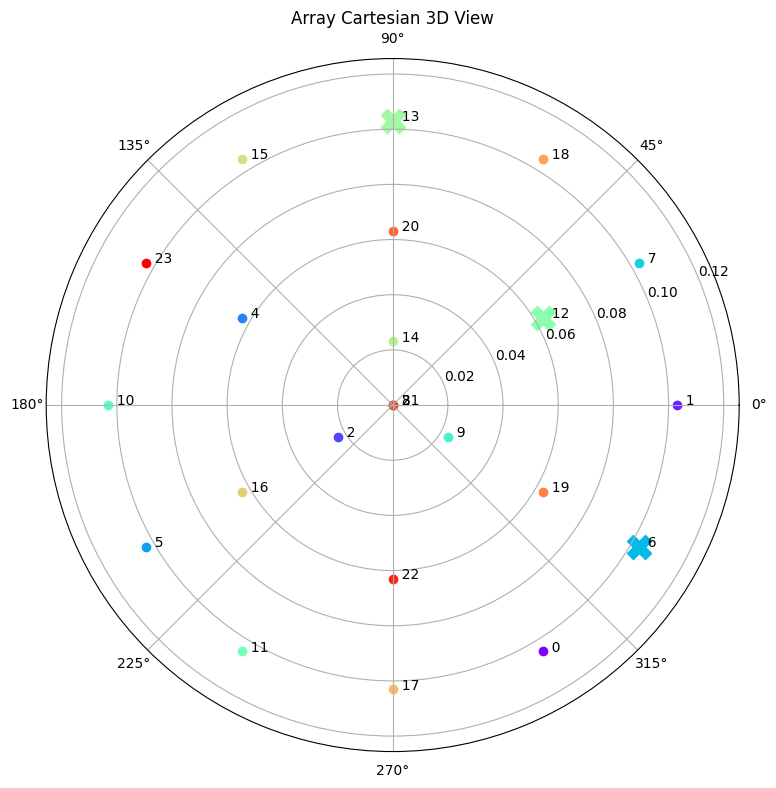

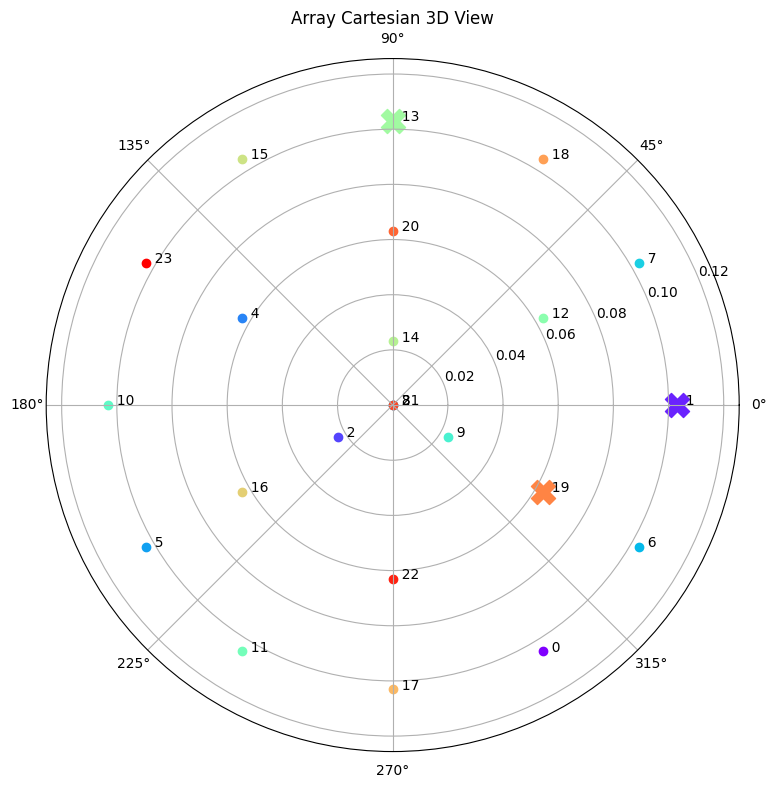

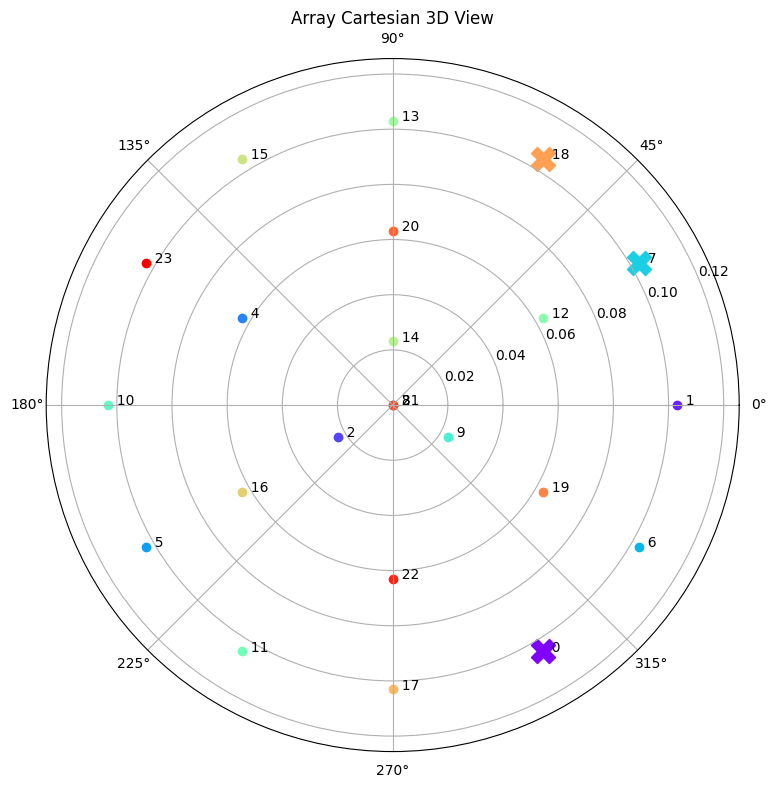

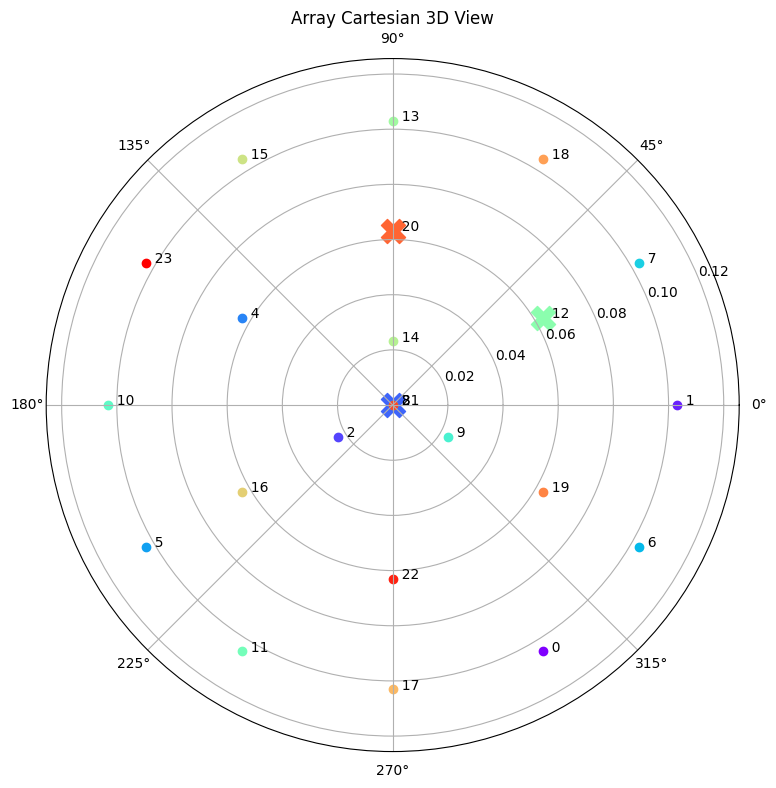

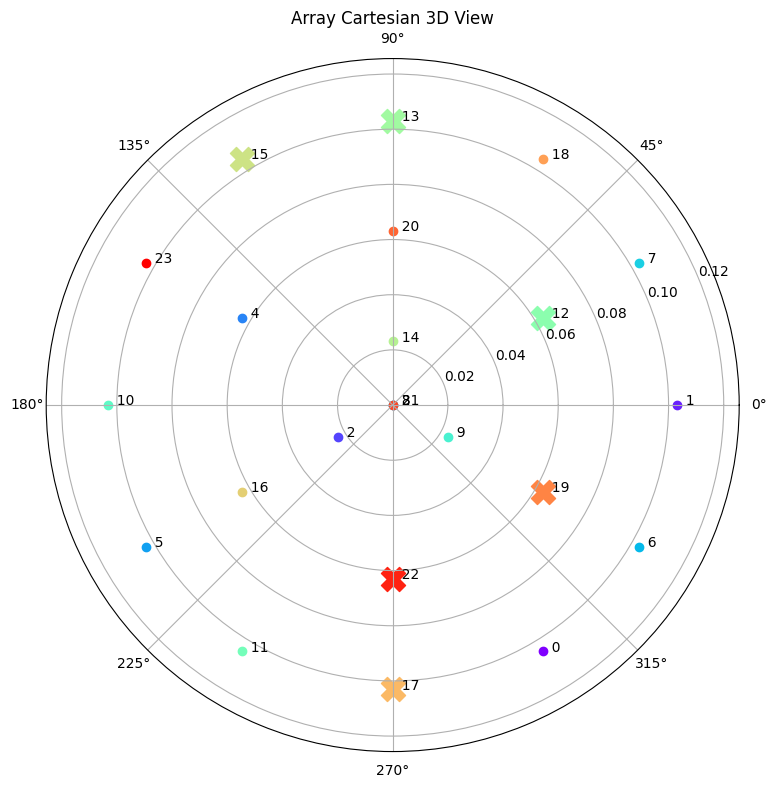

...

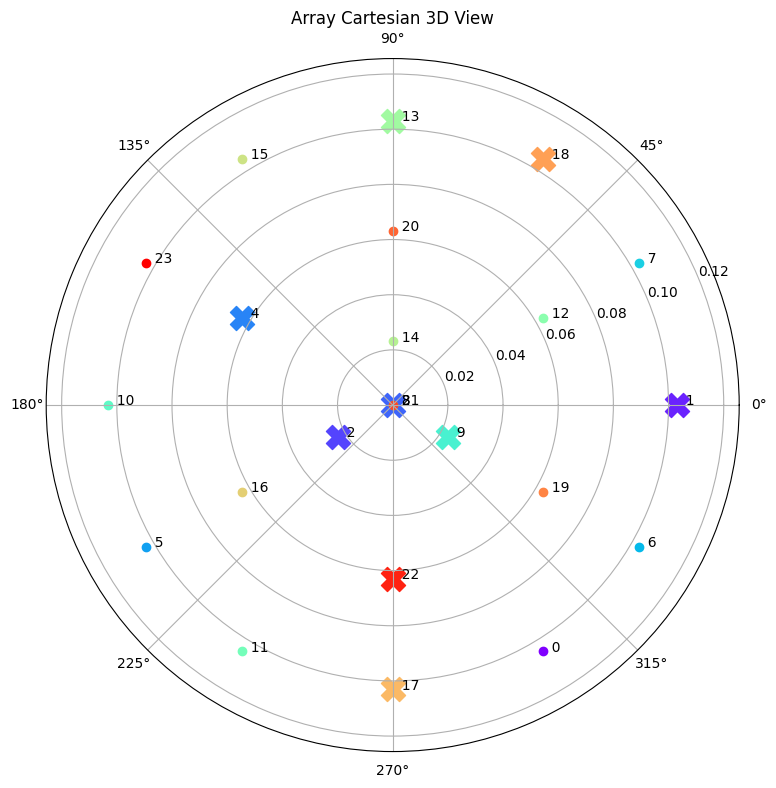

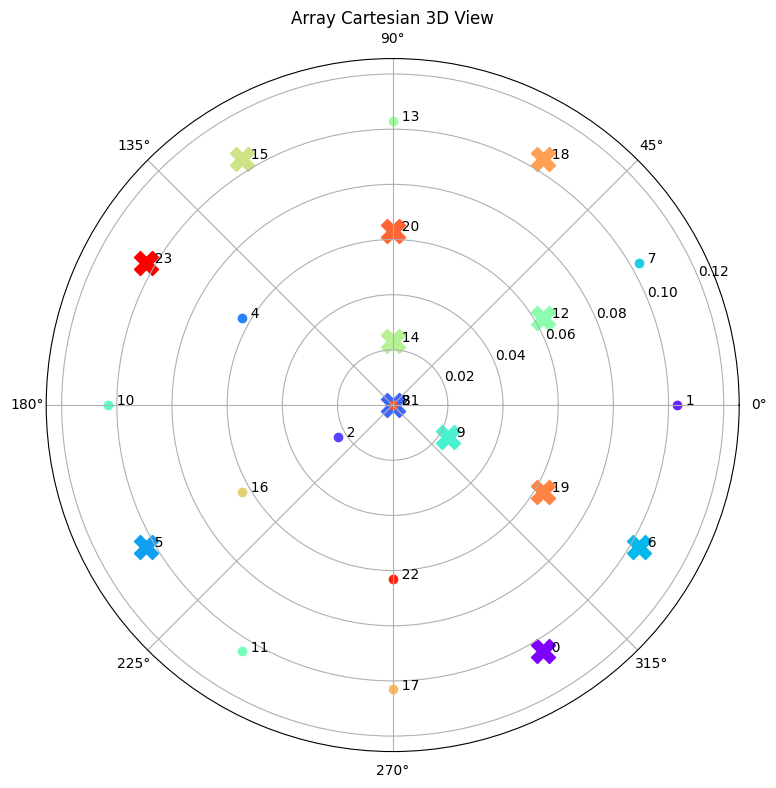

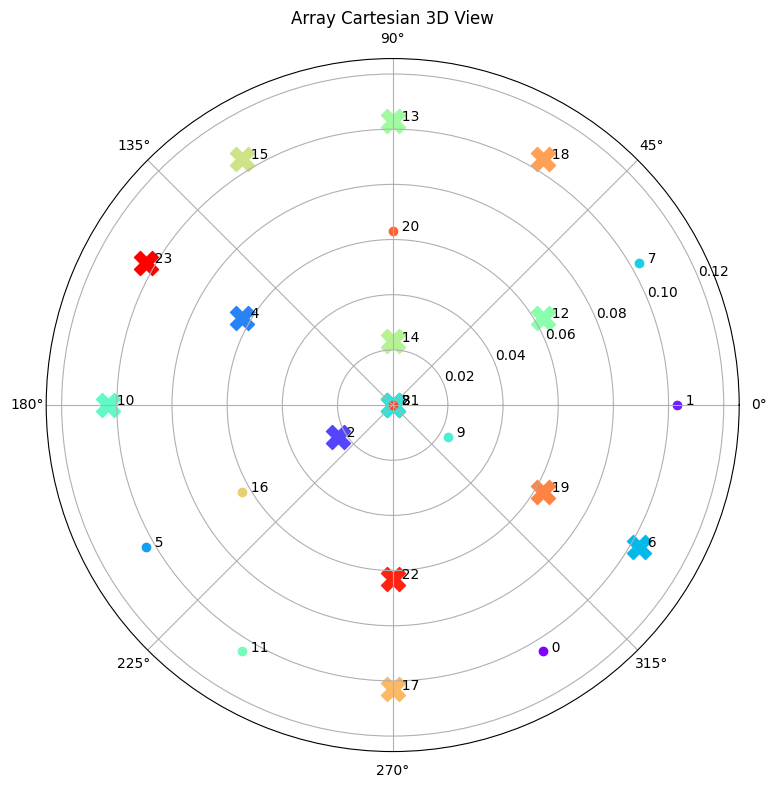

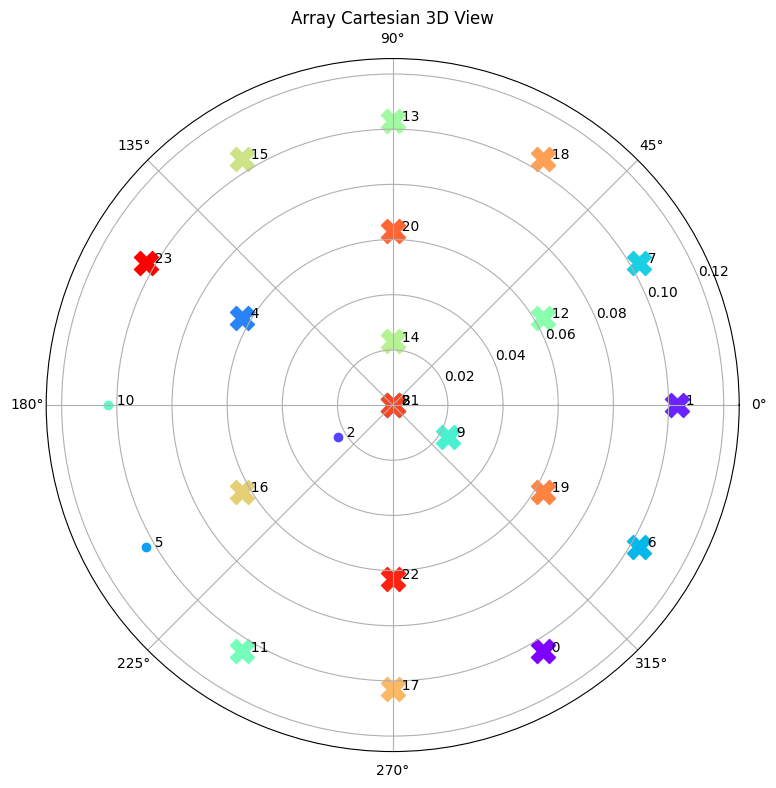

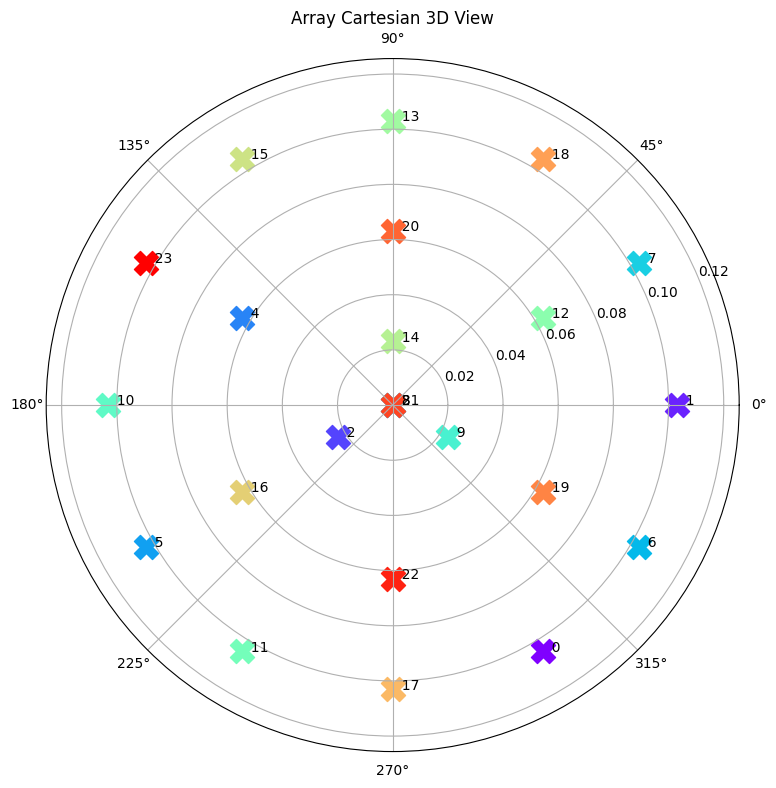

In [21]:
for channels in top_list_channels:
    visualizer.polar(fig_size=(10,9), channels = channels)

[0.0014870405429974198, 58328.42578125, 161.0408935546875]
[0.0011184224858880043, 57199.46484375, 159.81381225585938]
[0.0005343378870747983, 57848.97265625, 160.40591430664062]
[0.0020052650943398476, 57549.19921875, 160.15773010253906]
[0.01163140032440424, 49964.80078125, 140.21226501464844]
[0.000844527967274189, 57818.3125, 160.3629913330078]
[0.00044819654431194067, 57408.57421875, 160.1073760986328]
[0.0022553177550435066, 58018.859375, 160.9726104736328]
[0.0005310040432959795, 57693.6796875, 160.36622619628906]
[0.0013918193290010095, 57801.046875, 160.54183959960938]


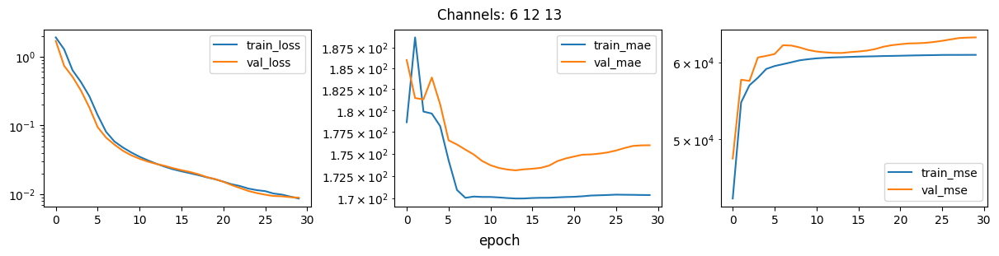

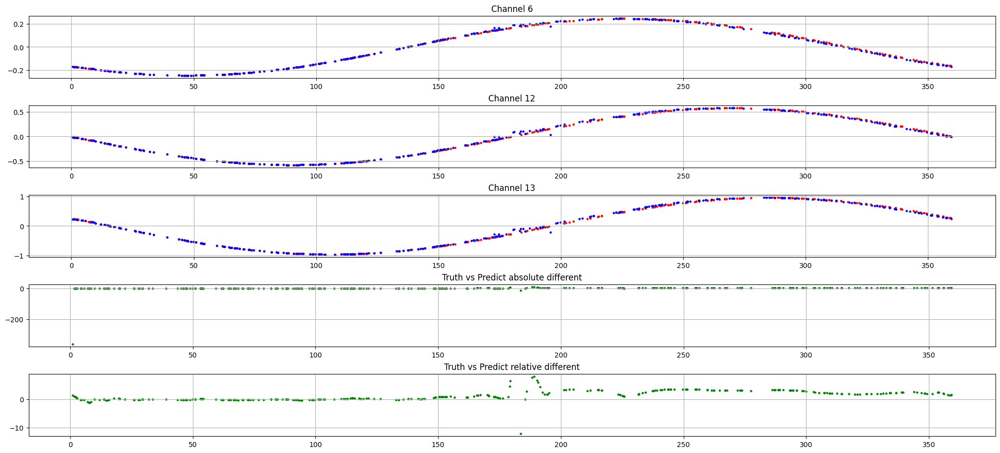

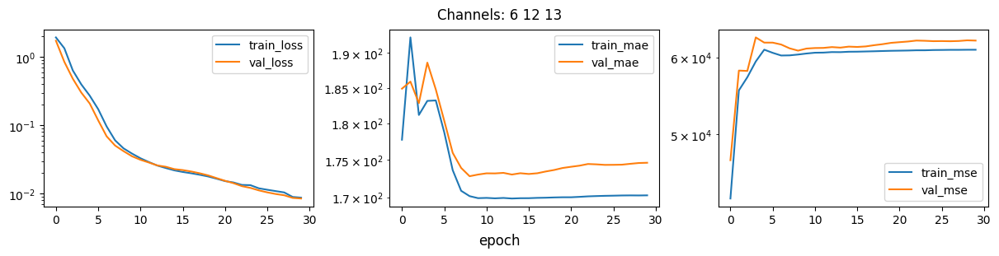

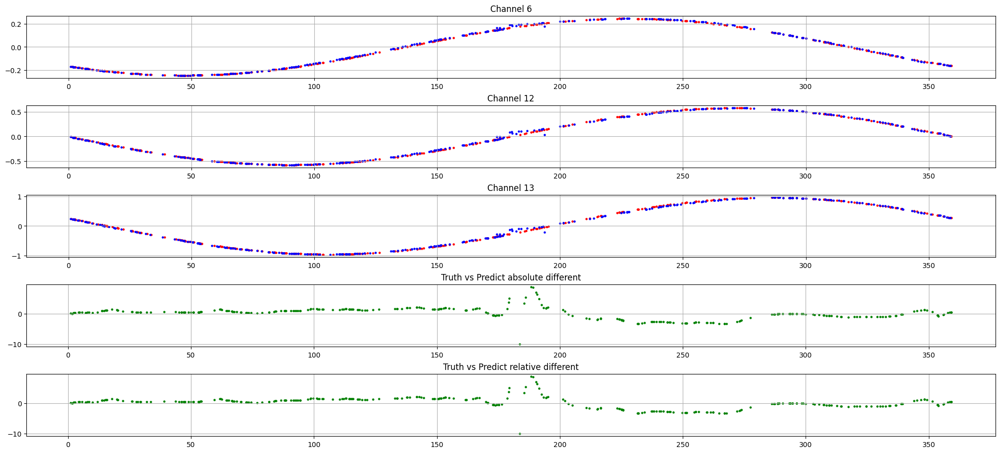

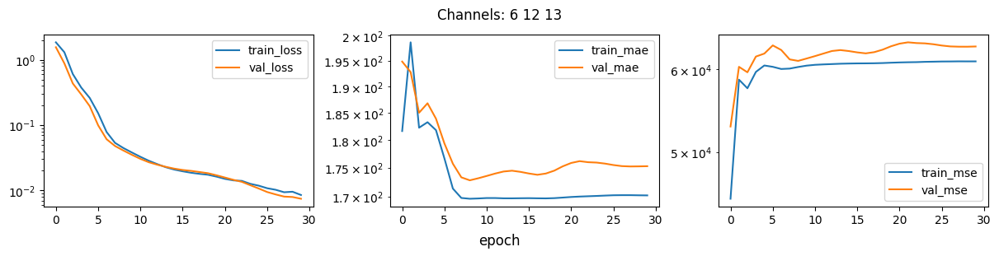

...

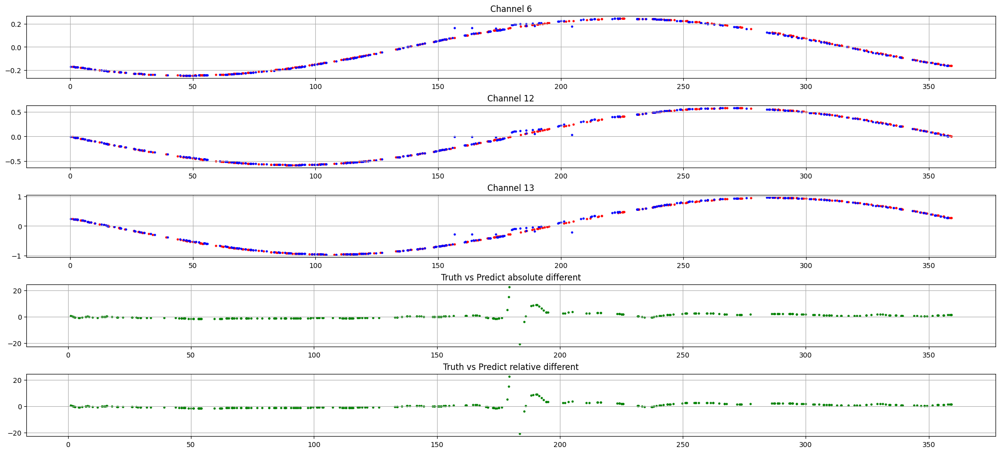

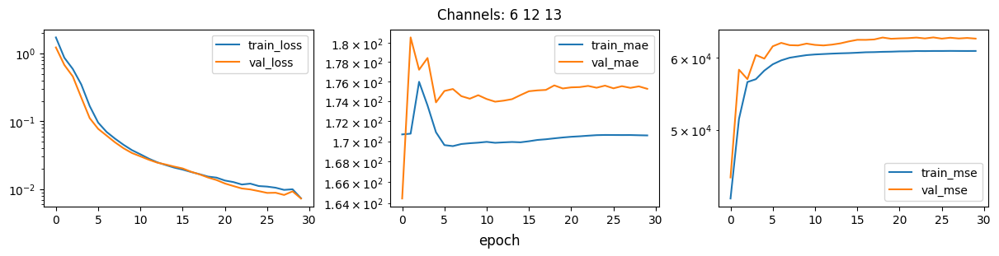

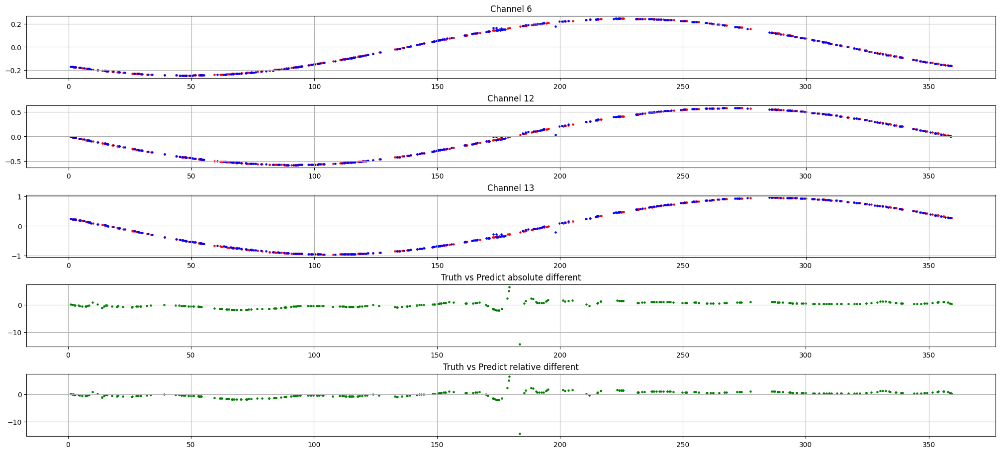

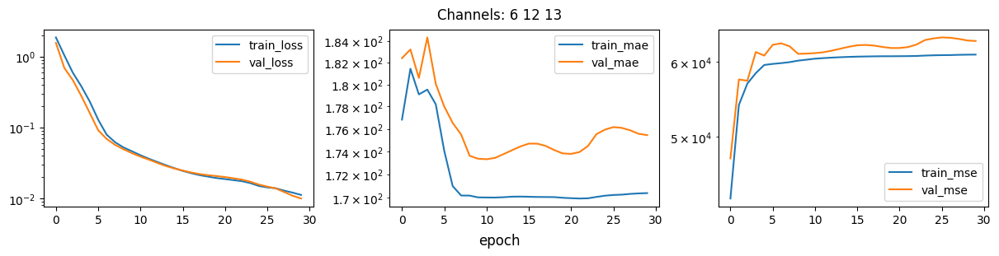

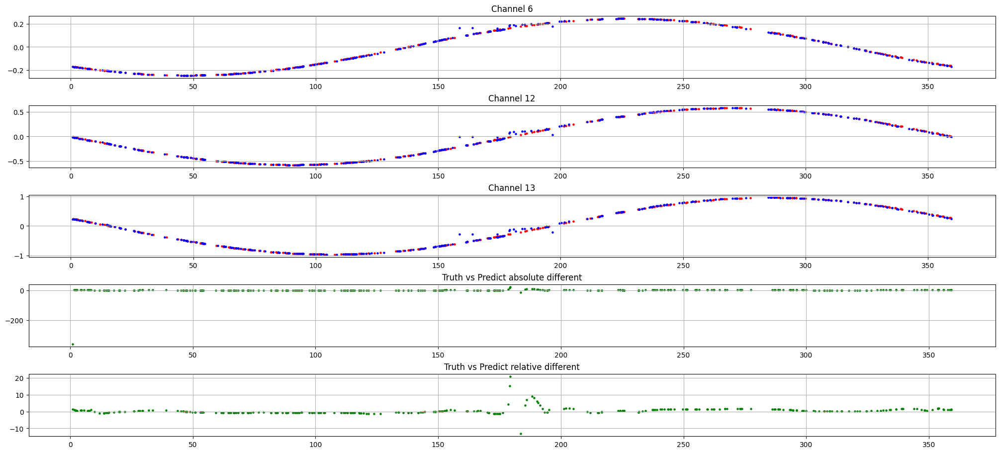

In [59]:
for i in range(10):
    models, evaluates, losses = training_evaluation(top_list_channels[:1], inputs, labels,\
                                                    he_initializer=True, loss = 'cossin',\
                                                    floormod=True, epochs=30, plot=True)

[36.885826110839844, 62821.8203125, 173.83758544921875]
[27.56952476501465, 64712.6796875, 179.25413513183594]
[14.537044525146484, 63131.44140625, 175.0050506591797]
[9.060553550720215, 63150.66796875, 175.16632080078125]
[9.29577350616455, 63080.4140625, 175.25990295410156]
[71.07756805419922, 36600.69140625, 104.7920913696289]
[15.03243350982666, 61850.66015625, 172.35787963867188]
[169.88360595703125, 62639.71875, 175.99684143066406]
[14.067111015319824, 63134.48046875, 175.37353515625]
[147.49114990234375, 55618.46875, 155.1435089111328]
[75.56129455566406, 68878.3984375, 191.25758361816406]


/tmp/ipykernel_1919081/2872147032.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt .subplots(ncols = 3, nrows=1, figsize=(12,3), layout="constrained")


[12.549247741699219, 56254.48828125, 157.53756713867188]


2025-04-23 17:14:45.270356: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


[52.624629974365234, 38219.1484375, 107.73246765136719]
[14.470595359802246, 55751.6796875, 155.11190795898438]
[86.6518783569336, 83564.65625, 230.093017578125]


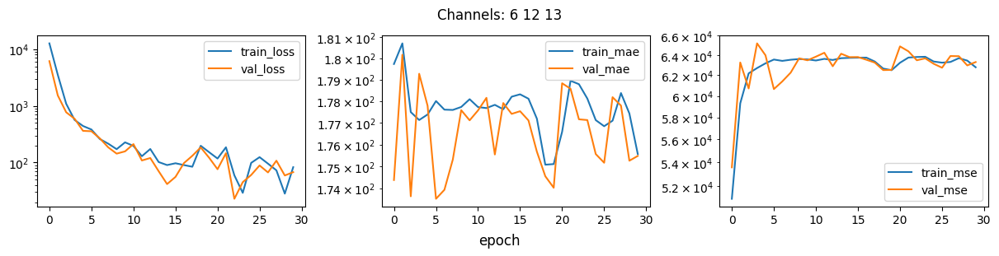

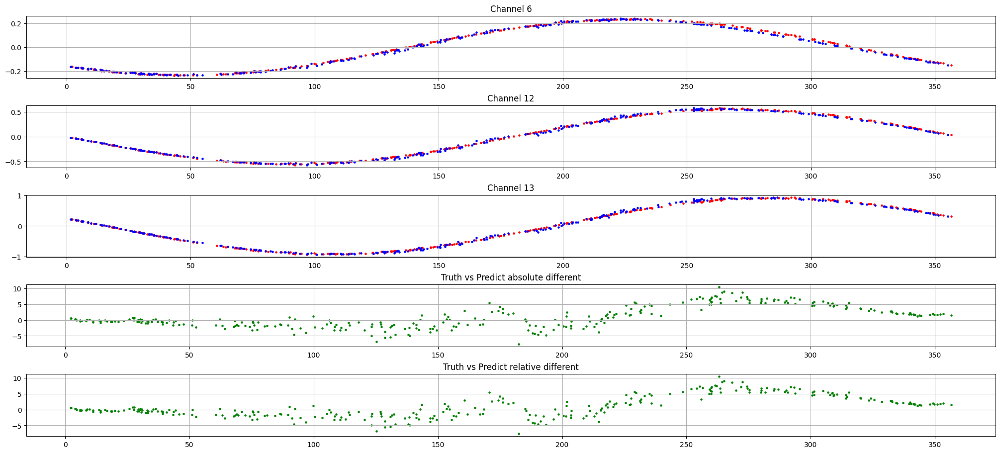

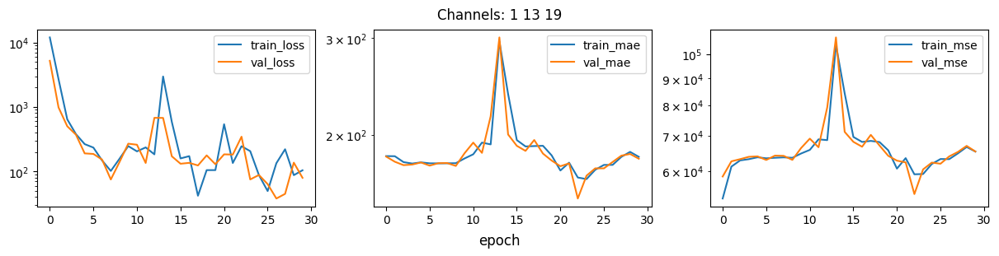

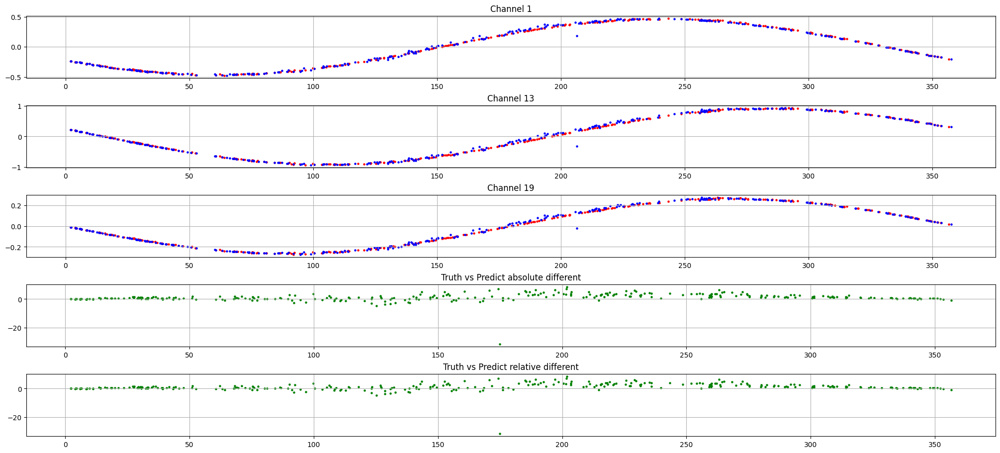

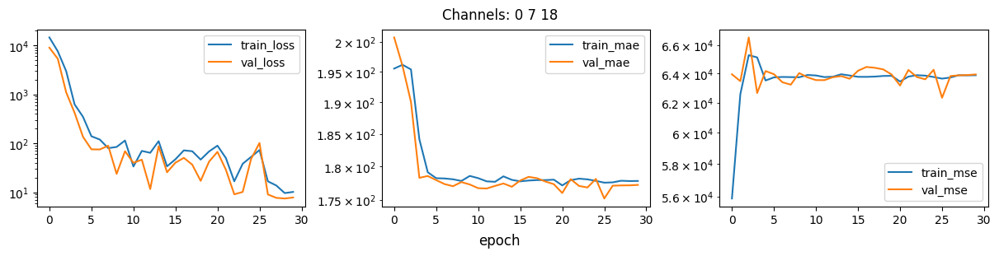

...

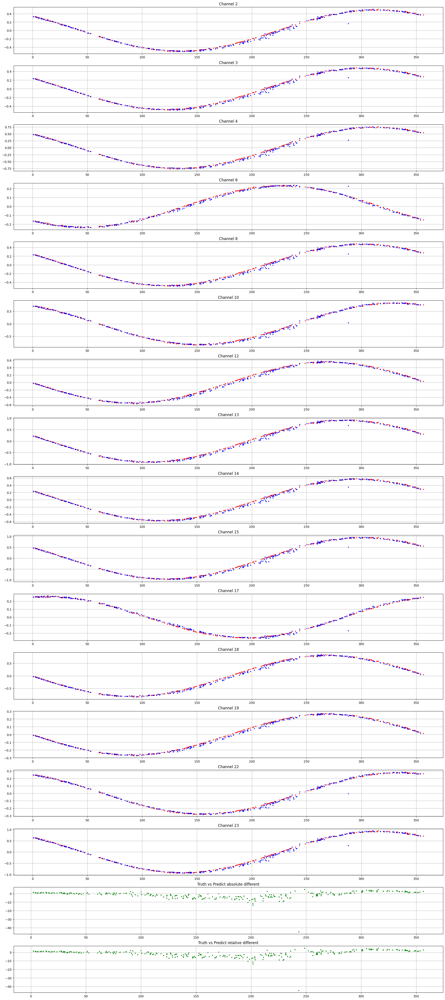

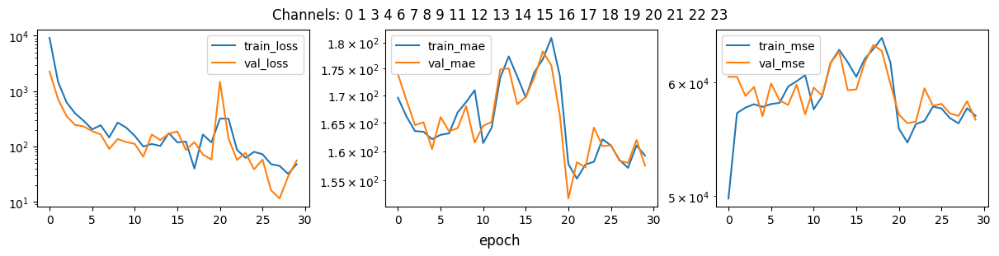

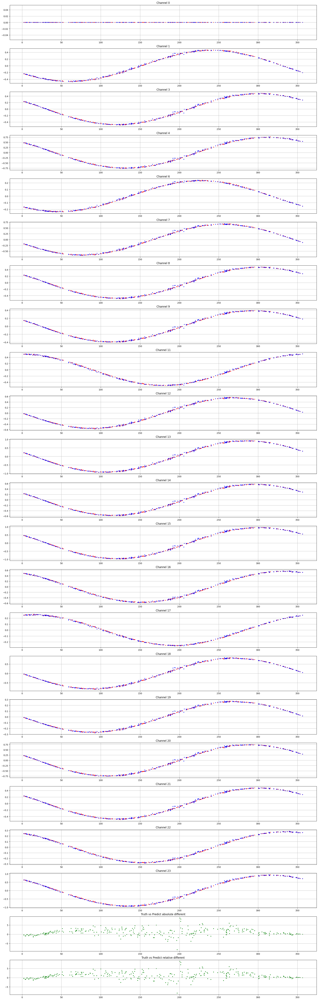

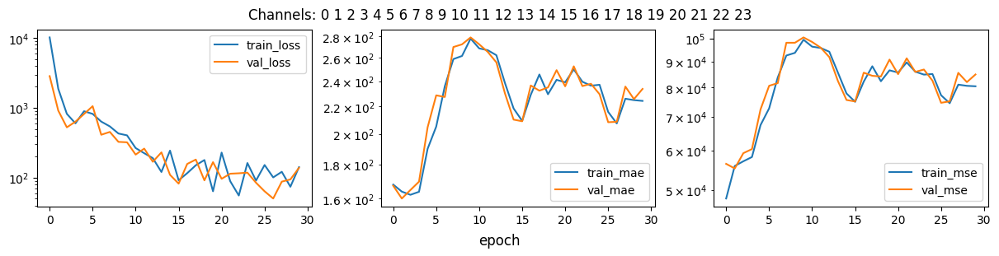

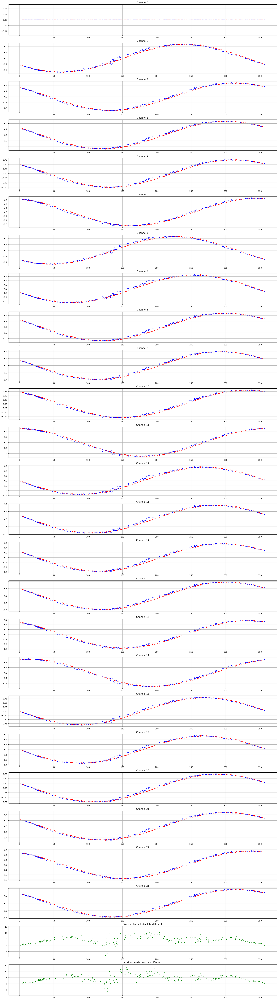

In [39]:
models, evaluates, losses = training_evaluation(top_list_channels[, inputs, labels,\
                                                he_initializer=True, loss = 'cossin',\
                                                floormod=True, epochs=30, plot=True)

[0.020277611911296844, 51541.53515625, 149.14120483398438]
[0.012093987315893173, 52269.27734375, 156.37913513183594]


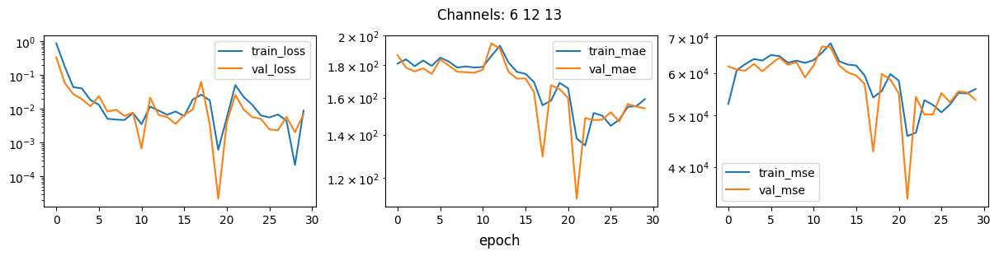

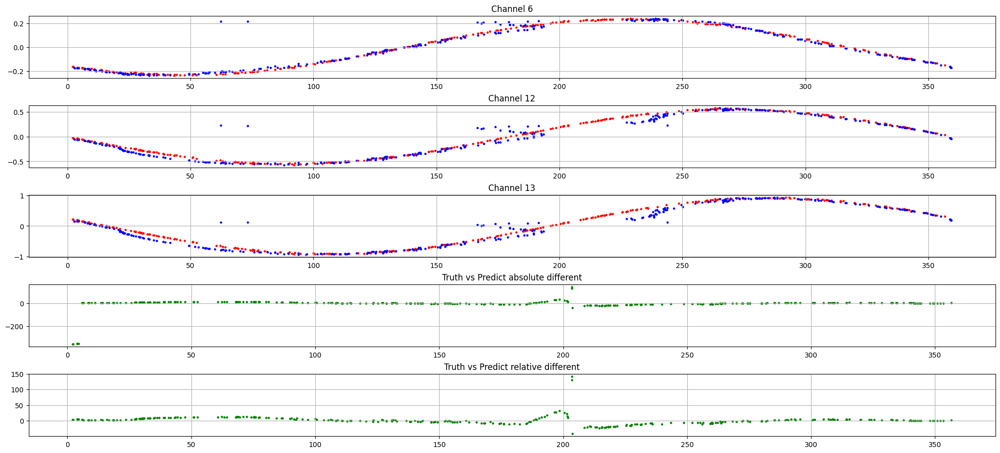

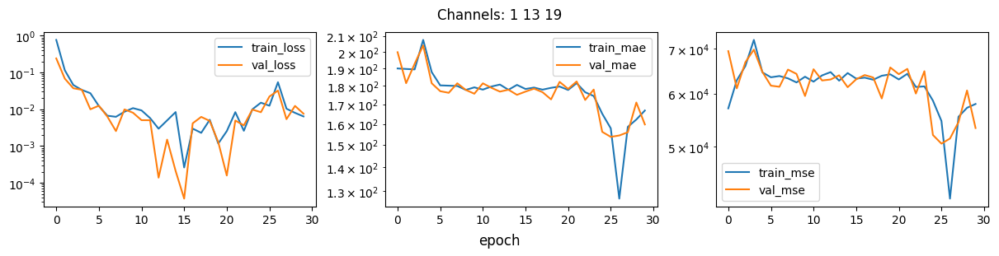

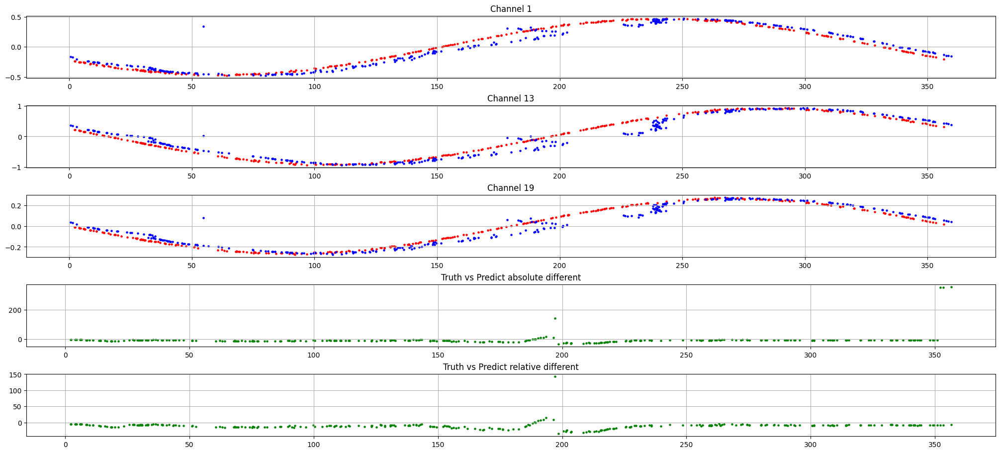

In [32]:
models, evaluates, losses = training_evaluation(top_list_channels[:2], inputs, labels,\
                                                he_initializer=True, loss = 'cos',\
                                                floormod=True, epochs=30, plot=True)

In [124]:
evaluates[3].evaluate()

[0.005320702213793993, 470.2884521484375, 4.452014446258545]

Inputs
tf.Tensor(
[[-0.01471677  0.27298108  0.12781718]
 [-0.10861206  0.17729372 -0.01604015]
 [-0.14649159  0.12636513 -0.08051151]
 [-0.12157089  0.16630149 -0.03473848]
 [-0.0658797   0.22618556  0.05222046]
 [-0.12443215  0.15601337 -0.04297149]
 [-0.0672518   0.21970767  0.04746604]
 [-0.17105353  0.09777623 -0.12000072]
 [-0.06768572  0.22112507  0.04777223]
 [-0.09165254  0.19476104  0.01003969]
 [-0.08366778  0.21359897  0.02786046]
 [-0.08456215  0.2097007   0.02493066]
 [-0.15733397  0.1193859  -0.094998  ]
 [-0.02459747  0.261759    0.11207697]
 [-0.08406439  0.20256317  0.02170163]
 [-0.16514     0.10689253 -0.10932732]], shape=(16, 3), dtype=float32)
Y Truth Y Predict
[[209.7     208.35164]
 [198.5     195.63095]
 [193.4     193.2351 ]
 [197.1     192.6075 ]
 [203.7     199.96736]
 [196.4     194.7456 ]
 [203.4     201.65979]
 [190.3     190.3273 ]
 [203.4     200.91548]
 [200.5     198.25777]
 [201.8     195.60524]
 [201.6     196.56146]
 [192.4     189.78299]
 [208.5  

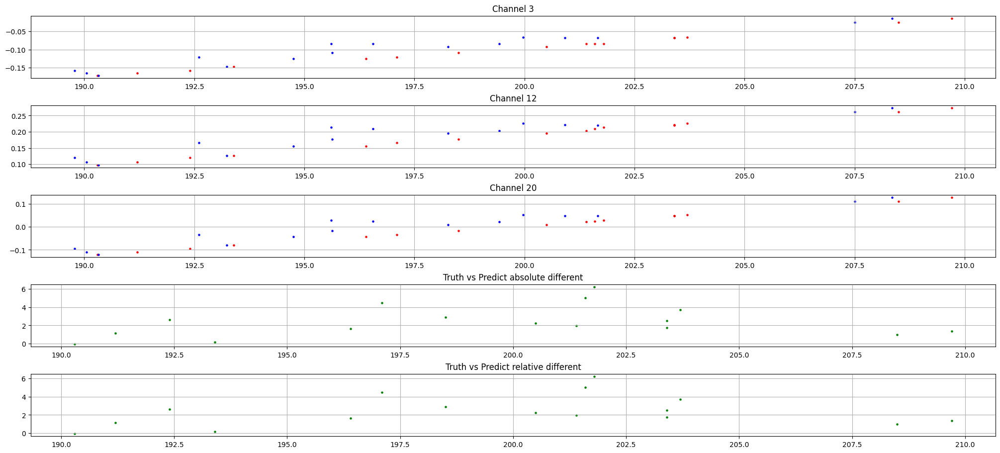

In [67]:
evaluates[3].plot_evaluation(190,210,True)

[165.90602111816406, 20836.443359375, 111.5914306640625]
[61.2451286315918, 11769.05859375, 64.98648834228516]
[181.4226837158203, 19177.220703125, 106.0365219116211]
[38.311317443847656, 18186.44921875, 99.4586410522461]
[7.83493185043335, 16932.32421875, 94.53926849365234]
[65.95626068115234, 24210.857421875, 129.0668182373047]
[29.141693115234375, 14814.7197265625, 82.01739501953125]
[12.72506046295166, 21633.017578125, 119.62022399902344]
[60.51173782348633, 19516.15234375, 101.0125503540039]
[67.21979522705078, 18602.634765625, 100.0393295288086]
[14.98176097869873, 18214.826171875, 101.77840423583984]


/tmp/ipykernel_1180689/1101515838.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt .subplots(ncols = 3, nrows=1, figsize=(12,3), layout="constrained")


[8.578919410705566, 17039.1015625, 93.79730224609375]
[11.340874671936035, 15459.1396484375, 85.62751007080078]
[51.82087707519531, 18263.580078125, 101.63135528564453]
[5.743484020233154, 19450.36328125, 107.18556213378906]


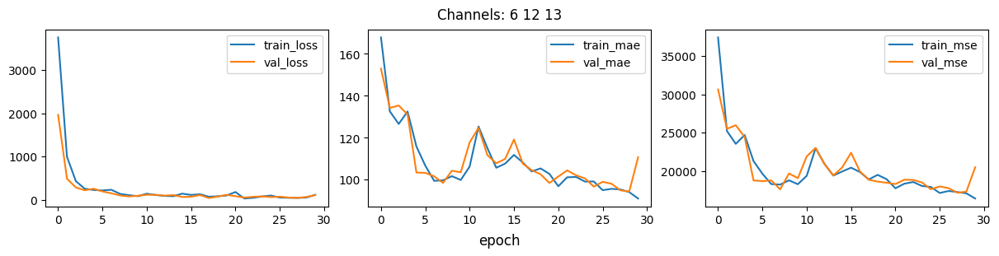

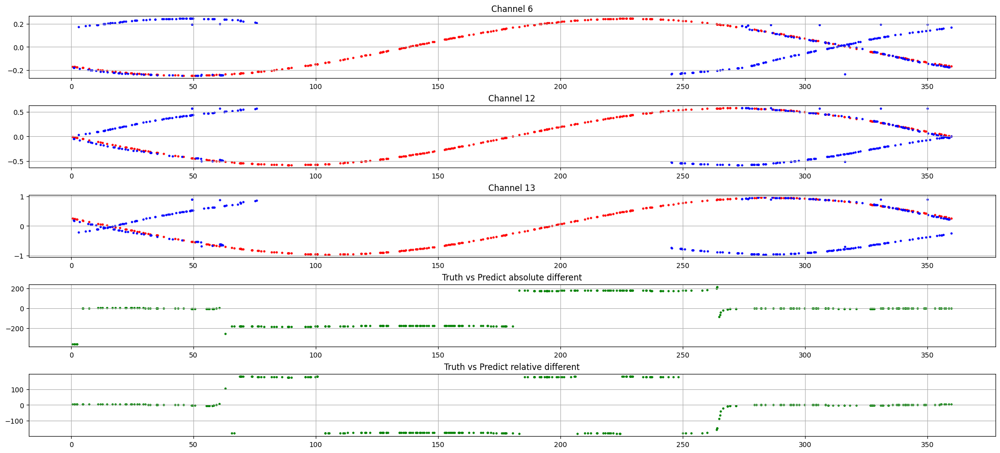

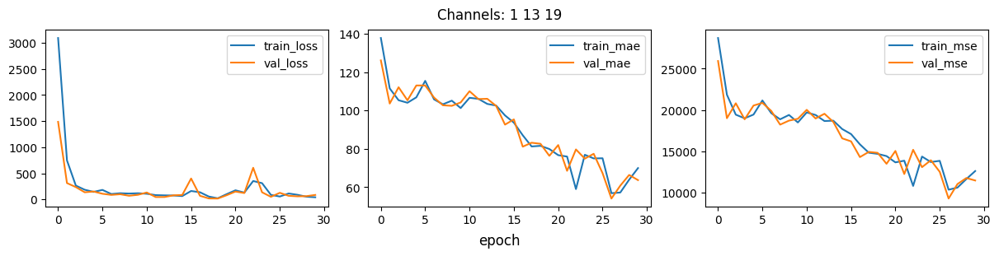

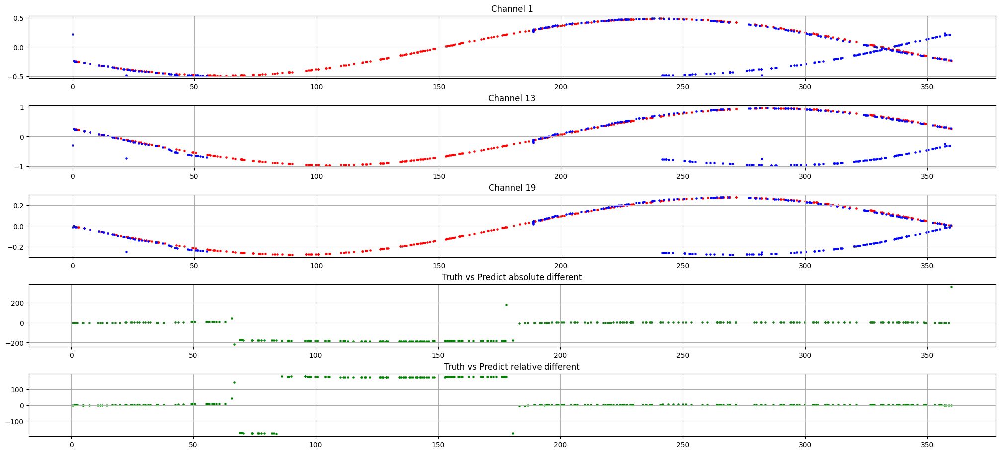

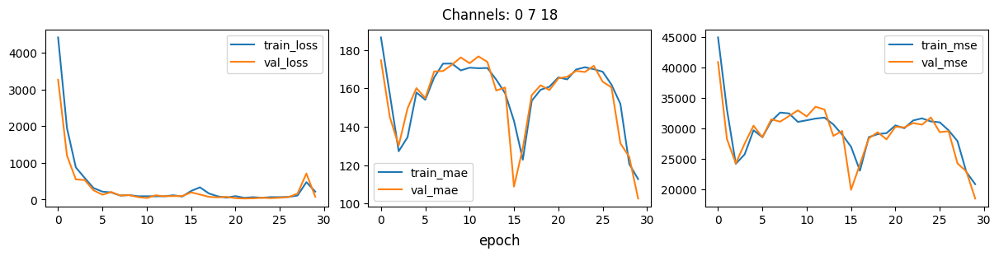

...

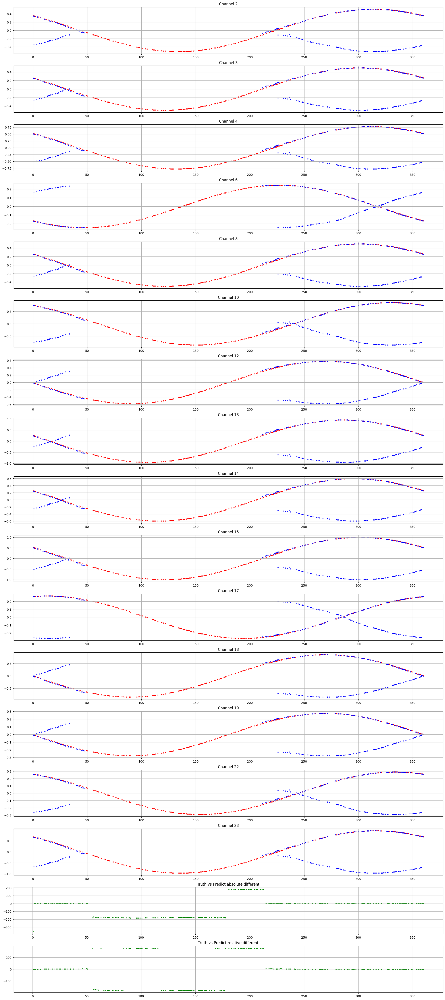

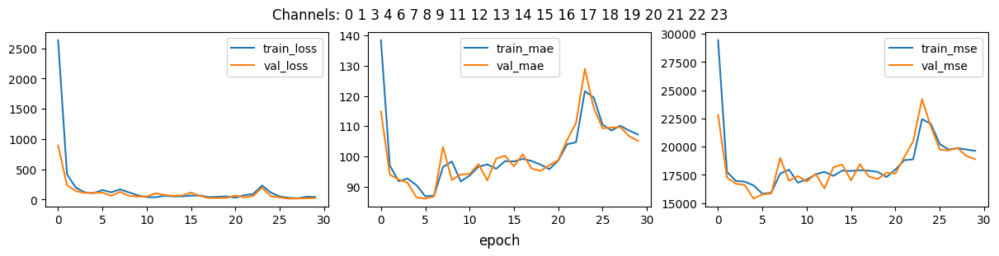

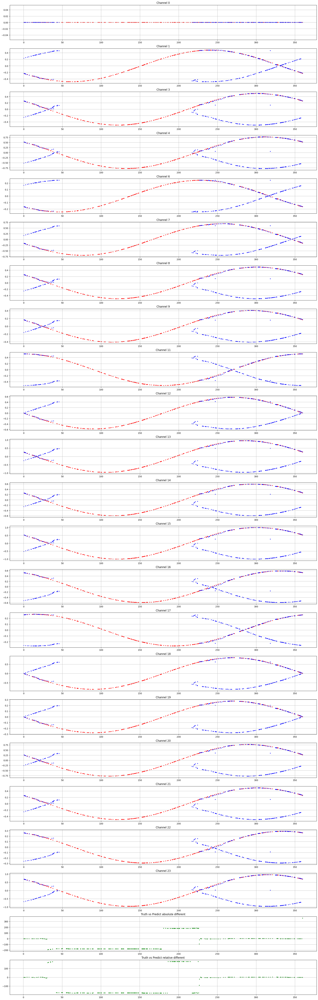

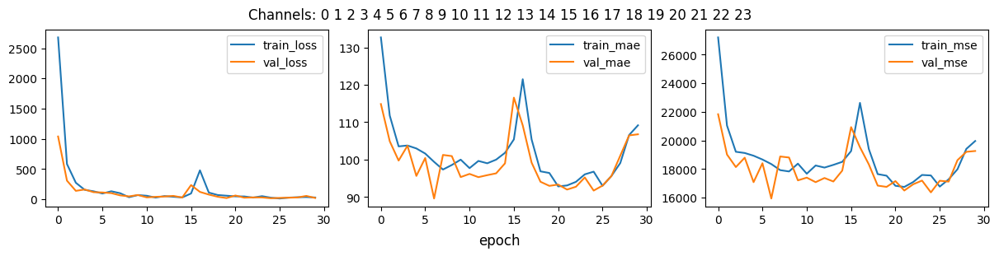

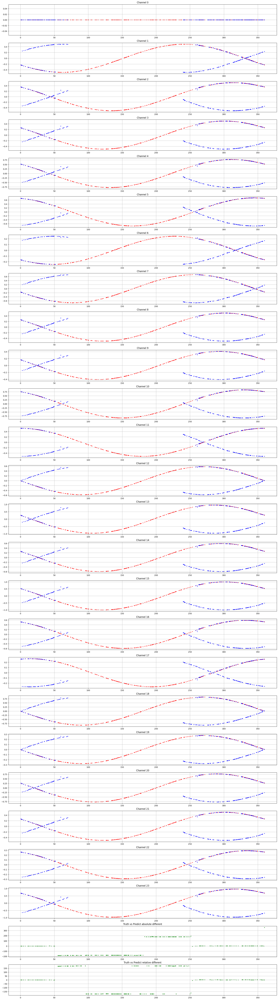

In [131]:
models, evaluates, losses = training_evaluation(top_list_channels, inputs, labels,\
                                                he_initializer=True, loss = 'cossin',\
                                                floormod=True, epochs=30, plot=True)